In [ ]:
import os
import shutil
from google.colab import drive
from google.colab import files
import zipfile

# ========== 1. 挂载 Google Drive ========== #
drive.mount('/content/drive')





Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# ========== 2. 数据集上传和解压 ========== #
# 数据集路径
DATA_DIR = '/content/retail_robust/data/'
os.makedirs(DATA_DIR, exist_ok=True)

# 上传的 ZIP 文件路径
train_zip = '/content/drive/MyDrive/retail_robust/selected_train.zip'
val_zip = '/content/drive/MyDrive/retail_robust/selected_val.zip'

# 解压数据集
with zipfile.ZipFile(train_zip, 'r') as zip_ref:
    zip_ref.extractall(DATA_DIR)
with zipfile.ZipFile(val_zip, 'r') as zip_ref:
    zip_ref.extractall(DATA_DIR)

print('数据集解压完成。')

# 检查文件数量
print('训练集图片数:', len(os.listdir(os.path.join(DATA_DIR, 'selected_train'))))
print('验证集图片数:', len(os.listdir(os.path.join(DATA_DIR, 'selected_val'))))

数据集解压完成。
训练集图片数: 10119
验证集图片数: 6000


In [ ]:
import os
import json

# 路径配置
train_dir = "/content/retail_robust/data/selected_train"
val_dir = "/content/retail_robust/data/selected_val"

# 修改后的 JSON 文件路径
train_json_path = "/content/drive/MyDrive/retail_robust/filtered_train.json"
val_json_path = "/content/drive/MyDrive/retail_robust/filtered_val.json"

def create_labels(json_path, img_dir):
    with open(json_path, 'r') as f:
        data = json.load(f)

    # 获取图片信息
    img_dict = {img['id']: img['file_name'] for img in data['images']}

    # 遍历标注信息
    for ann in data['annotations']:
        img_id = ann['image_id']
        class_id = ann['category_id']
        bbox = ann['bbox']  # [x_min, y_min, width, height]

        # 获取图片路径
        img_name = img_dict[img_id]
        img_path = os.path.join(img_dir, img_name)

        # 如果图片不存在，则跳过
        if not os.path.exists(img_path):
            continue

        # 获取图片尺寸
        img_info = next(img for img in data['images'] if img['id'] == img_id)
        img_width, img_height = img_info['width'], img_info['height']

        # 转换为 YOLO 格式
        x_center = (bbox[0] + bbox[2] / 2) / img_width
        y_center = (bbox[1] + bbox[3] / 2) / img_height
        width = bbox[2] / img_width
        height = bbox[3] / img_height

        # 标签文件路径
        label_path = os.path.join(img_dir, img_name.replace('.jpg', '.txt'))

        # 写入标签文件
        with open(label_path, 'a') as f:
            f.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

# 生成训练集标签文件
create_labels(train_json_path, train_dir)

# 生成验证集标签文件
create_labels(val_json_path, val_dir)

print("标签文件生成完成。")


标签文件生成完成。


In [ ]:
# 检查生成的 .txt 文件数量
train_labels = [f for f in os.listdir(train_dir) if f.endswith('.txt')]
val_labels = [f for f in os.listdir(val_dir) if f.endswith('.txt')]

print(f"训练集标签文件数量: {len(train_labels)}")
print(f"验证集标签文件数量: {len(val_labels)}")


训练集标签文件数量: 10119
验证集标签文件数量: 6000


In [ ]:
# ========== 3. YOLOv8 配置文件生成 ========== #
yaml_content = '''
train: /content/retail_robust/data/selected_train/
val: /content/retail_robust/data/selected_val/
nc: 50
names:
  - sku_1
  - sku_2
  - sku_3
  - sku_4
  - sku_5
  - sku_6
  - sku_7
  - sku_8
  - sku_9
  - sku_10
  - sku_11
  - sku_12
  - sku_13
  - sku_14
  - sku_15
  - sku_16
  - sku_17
  - sku_18
  - sku_19
  - sku_20
  - sku_21
  - sku_22
  - sku_23
  - sku_24
  - sku_25
  - sku_26
  - sku_27
  - sku_28
  - sku_29
  - sku_30
  - sku_31
  - sku_32
  - sku_33
  - sku_34
  - sku_35
  - sku_36
  - sku_37
  - sku_38
  - sku_39
  - sku_40
  - sku_41
  - sku_42
  - sku_43
  - sku_44
  - sku_45
  - sku_46
  - sku_47
  - sku_48
  - sku_49
  - sku_50
'''

with open('/content/retail_robust/yolo_rpc.yaml', 'w') as f:
    f.write(yaml_content)
print('YOLO 配置文件生成完成。')

YOLO 配置文件生成完成。


In [ ]:

# ========== 4. 模型训练与保存 ========== #
!pip install -q ultralytics
from ultralytics import YOLO

# 初始化模型
model = YOLO('yolov8s.pt')

# 开始训练
model.train(
    data='/content/retail_robust/yolo_rpc.yaml',
    epochs=50,
    imgsz=640,
    batch=16,
    project='/content/retail_robust/results/',
    name='yolo_train'
)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 100.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 106.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultr

100%|██████████| 21.5M/21.5M [00:00<00:00, 320MB/s]


Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/retail_robust/yolo_rpc.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=T

100%|██████████| 755k/755k [00:00<00:00, 35.7MB/s]

Overriding model.yaml nc=80 with nc=50

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

Model summary: 129 layers, 11,154,950 parameters, 11,154,934 gradients, 28.8 GFLOPs

Transferred 349/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 167MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2204.2±1287.5 MB/s, size: 156.8 KB)


train: Scanning /content/retail_robust/data/selected_train... 10119 images, 0 backgrounds, 7476 corrupt: 100%|██████████| 10119/10119 [01:38<00:00, 103.16it/s]

train: /content/retail_robust/data/selected_train/038900004095_camera0-10.jpg: ignoring corrupt image/label: Label class 112 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/038900004095_camera0-11.jpg: ignoring corrupt image/label: Label class 112 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/038900004095_camera0-12.jpg: ignoring corrupt image/label: Label class 112 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/038900004095_camera0-13.jpg: ignoring corrupt image/label: Label class 112 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/038900004095_camera0-14.jpg: ignoring corrupt image/label: Label class 112 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/0389000040

train: New cache created: /content/retail_robust/data/selected_train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1531.5±1175.0 MB/s, size: 254.7 KB)


val: Scanning /content/retail_robust/data/selected_val... 6000 images, 0 backgrounds, 5997 corrupt: 100%|██████████| 6000/6000 [00:03<00:00, 1660.96it/s]

流式输出内容被截断，只能显示最后 5000 行内容。
val: /content/retail_robust/data/selected_val/20180830-10-05-49-1476.jpg: ignoring corrupt image/label: Label class 87 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180830-10-06-14-1881.jpg: ignoring corrupt image/label: Label class 133 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180830-10-06-26-1881.jpg: ignoring corrupt image/label: Label class 133 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180830-10-06-33-1881.jpg: ignoring corrupt image/label: Label class 133 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180830-10-10-30-1481.jpg: ignoring corrupt image/label: Label class 174 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180830-10-1

Plotting labels to /content/retail_robust/results/yolo_train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000185, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/retail_robust/results/yolo_train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.68G     0.6745      4.333      1.054          8        640: 100%|██████████| 166/166 [00:21<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all          3         12      0.127      0.944      0.652      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.73G     0.5503      1.945     0.9578          4        640: 100%|██████████| 166/166 [00:19<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.03it/s]

                   all          3         12      0.987      0.702      0.922      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.77G     0.5307      1.217     0.9411          8        640: 100%|██████████| 166/166 [00:18<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]

                   all          3         12      0.904      0.494      0.845       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       3.8G     0.5058      0.914      0.932          4        640: 100%|██████████| 166/166 [00:18<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.11it/s]

                   all          3         12      0.424      0.778      0.768      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.84G     0.5073     0.7765     0.9346          4        640: 100%|██████████| 166/166 [00:18<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.05it/s]

                   all          3         12      0.811      0.436      0.717      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.87G     0.4893      0.644     0.9224          5        640: 100%|██████████| 166/166 [00:18<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.35it/s]

                   all          3         12      0.512      0.667       0.58      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.91G      0.475     0.5814     0.9139          6        640: 100%|██████████| 166/166 [00:19<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.60it/s]

                   all          3         12      0.589      0.778      0.821      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.95G     0.4661       0.55     0.9117         11        640: 100%|██████████| 166/166 [00:18<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.68it/s]

                   all          3         12      0.444      0.556      0.506       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.03G     0.4671     0.5257     0.9148          4        640: 100%|██████████| 166/166 [00:18<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.18it/s]

                   all          3         12      0.873      0.516      0.654      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.07G     0.4542     0.4921     0.9106          5        640: 100%|██████████| 166/166 [00:18<00:00,  8.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.61it/s]

                   all          3         12      0.741        0.5      0.706      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.16G     0.4564      0.455      0.907          5        640: 100%|██████████| 166/166 [00:18<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]


                   all          3         12      0.667      0.611      0.692      0.656

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.24G     0.4447     0.4404     0.9068          9        640: 100%|██████████| 166/166 [00:18<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.78it/s]

                   all          3         12      0.658      0.778      0.842      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.28G     0.4356     0.4274     0.9046          4        640: 100%|██████████| 166/166 [00:18<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 26.32it/s]

                   all          3         12      0.625      0.611       0.69      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.37G     0.4368     0.4144     0.9007          4        640: 100%|██████████| 166/166 [00:18<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.98it/s]

                   all          3         12      0.657      0.611      0.696      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       4.4G     0.4363     0.4105     0.9072          9        640: 100%|██████████| 166/166 [00:18<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.64it/s]

                   all          3         12      0.639      0.427      0.547      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.44G     0.4181      0.391      0.894          7        640: 100%|██████████| 166/166 [00:18<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.12it/s]

                   all          3         12      0.478      0.438      0.492      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.55G     0.4155      0.382     0.8969          8        640: 100%|██████████| 166/166 [00:18<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.08it/s]

                   all          3         12      0.667      0.611      0.679      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.59G     0.4167     0.4014     0.9022          4        640: 100%|██████████| 166/166 [00:18<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.21it/s]

                   all          3         12      0.721      0.416      0.439      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.68G     0.4122     0.3781     0.8993          7        640: 100%|██████████| 166/166 [00:18<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.90it/s]

                   all          3         12       0.75      0.611      0.739      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.76G     0.4053     0.3695     0.8953          6        640: 100%|██████████| 166/166 [00:18<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.30it/s]

                   all          3         12      0.414      0.444       0.49      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       4.8G     0.4088     0.3667     0.8916          9        640: 100%|██████████| 166/166 [00:18<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.95it/s]

                   all          3         12      0.898       0.53      0.572       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.89G     0.3968     0.3519      0.892          8        640: 100%|██████████| 166/166 [00:18<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.76it/s]

                   all          3         12      0.643      0.722       0.68      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.92G     0.4067     0.3388     0.8917          7        640: 100%|██████████| 166/166 [00:19<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.27it/s]


                   all          3         12      0.582      0.584      0.636      0.454

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.01G       0.39     0.3354     0.8912          4        640: 100%|██████████| 166/166 [00:18<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.71it/s]

                   all          3         12        0.7      0.722      0.744      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.05G     0.3914     0.3339     0.8877          7        640: 100%|██████████| 166/166 [00:18<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.69it/s]

                   all          3         12       0.75      0.722       0.83      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.13G      0.381     0.3114     0.8825          8        640: 100%|██████████| 166/166 [00:18<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.03it/s]

                   all          3         12      0.942      0.522      0.744      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.22G     0.3802     0.3137     0.8875          4        640: 100%|██████████| 166/166 [00:18<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.73it/s]

                   all          3         12      0.556        0.5      0.583      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.26G     0.3831     0.3062     0.8864          7        640: 100%|██████████| 166/166 [00:18<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.77it/s]

                   all          3         12      0.689      0.556      0.707      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.35G      0.383     0.3125     0.8806         10        640: 100%|██████████| 166/166 [00:18<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.37it/s]

                   all          3         12      0.417      0.556      0.499      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.38G     0.3698     0.2961     0.8793          6        640: 100%|██████████| 166/166 [00:18<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.33it/s]

                   all          3         12      0.486      0.473      0.521       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.47G     0.3805     0.3106     0.8854          7        640: 100%|██████████| 166/166 [00:18<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.18it/s]

                   all          3         12      0.383      0.556      0.466      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.55G     0.3792     0.3075     0.8875          5        640: 100%|██████████| 166/166 [00:18<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.19it/s]

                   all          3         12      0.965      0.333      0.521      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.59G     0.3646     0.2871     0.8818          3        640: 100%|██████████| 166/166 [00:18<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.42it/s]

                   all          3         12       0.45      0.667      0.608      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.63G     0.3584     0.2802     0.8766          7        640: 100%|██████████| 166/166 [00:18<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.17it/s]

                   all          3         12      0.978      0.518      0.636      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.71G     0.3586     0.2779     0.8803          9        640: 100%|██████████| 166/166 [00:18<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.36it/s]


                   all          3         12      0.911      0.532      0.655      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.75G     0.3575     0.2728     0.8771          5        640: 100%|██████████| 166/166 [00:19<00:00,  8.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.43it/s]

                   all          3         12       0.58      0.538      0.548      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.84G     0.3661     0.2762     0.8859          3        640: 100%|██████████| 166/166 [00:18<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.51it/s]


                   all          3         12      0.953      0.556      0.646       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.93G     0.3586     0.2742     0.8755          9        640: 100%|██████████| 166/166 [00:18<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.18it/s]

                   all          3         12      0.993      0.429      0.554      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      5.96G     0.3586     0.2605     0.8796          6        640: 100%|██████████| 166/166 [00:18<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.29it/s]


                   all          3         12       0.45      0.667      0.592      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         6G     0.3549     0.2702     0.8791          7        640: 100%|██████████| 166/166 [00:18<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.48it/s]

                   all          3         12      0.867      0.778      0.858       0.74


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.16G     0.2476     0.1953     0.7982          3        640: 100%|██████████| 166/166 [00:20<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.00it/s]


                   all          3         12      0.913      0.533      0.581      0.524

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       6.2G     0.2415     0.1827     0.7958          3        640: 100%|██████████| 166/166 [00:18<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.65it/s]

                   all          3         12          1      0.536      0.776      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.23G     0.2391     0.1826     0.7916          3        640: 100%|██████████| 166/166 [00:18<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.71it/s]

                   all          3         12          1       0.55      0.591       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.27G     0.2355     0.1737     0.7919          3        640: 100%|██████████| 166/166 [00:18<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 25.16it/s]

                   all          3         12      0.618      0.535      0.591      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.36G     0.2336     0.1729     0.7926          3        640: 100%|██████████| 166/166 [00:18<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.49it/s]

                   all          3         12      0.667       0.55      0.581      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.39G     0.2319     0.1671     0.7895          3        640: 100%|██████████| 166/166 [00:18<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.85it/s]

                   all          3         12      0.667      0.667      0.663       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.48G     0.2295     0.1635     0.7875          3        640: 100%|██████████| 166/166 [00:18<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.66it/s]

                   all          3         12       0.86       0.64      0.583      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.57G     0.2268     0.1679     0.7837          3        640: 100%|██████████| 166/166 [00:18<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.54it/s]

                   all          3         12      0.539      0.556      0.583      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       6.6G     0.2223      0.161     0.7885          3        640: 100%|██████████| 166/166 [00:18<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.50it/s]

                   all          3         12       0.45      0.667      0.555      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.64G     0.2215     0.1546     0.7891          3        640: 100%|██████████| 166/166 [00:18<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.69it/s]

                   all          3         12      0.383      0.556      0.512      0.402



50 epochs completed in 0.269 hours.
Optimizer stripped from /content/retail_robust/results/yolo_train/weights/last.pt, 22.6MB
Optimizer stripped from /content/retail_robust/results/yolo_train/weights/best.pt, 22.6MB

Validating /content/retail_robust/results/yolo_train/weights/best.pt...
Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 11,144,934 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.22it/s]


                   all          3         12      0.985      0.704      0.922      0.748
                sku_17          3          3          1      0.844      0.995      0.701
                sku_42          3          6      0.955      0.667      0.777      0.549
                sku_50          3          3          1        0.6      0.995      0.995
Speed: 0.2ms preprocess, 2.8ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to /content/retail_robust/results/yolo_train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([16, 41, 49])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ca3d362b110>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [ ]:
model = YOLO('yolov8s.pt')
model.train(
    data='/content/retail_robust/yolo_rpc.yaml',
    epochs=60,
    imgsz=640,
    batch=16,
    name='yolo_train_robust',
    project='/content/retail_robust/results',
    # ----------鲁棒增强参数-----------
    augment=True,          # 打开所有默认随机增强
    degrees=10,            # 随机旋转 ±10°
    translate=0.10,        # 平移
    scale=0.5,             # 缩放
    shear=2,               # 剪切
    perspective=0.0005,    # 透视畸变
    mosaic=1.0,            # 100% 使用 Mosaic
    mixup=0.2,             # 20% 图像做 MixUp
    hsv_h=0.1, hsv_s=0.7, hsv_v=0.6   # 颜色扰动
)



Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/retail_robust/yolo_rpc.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.1, hsv_s=0.7, hsv_v=0.6, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_train_robust, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0005, p

train: Scanning /content/retail_robust/data/selected_train.cache... 10119 images, 0 backgrounds, 7476 corrupt: 100%|██████████| 10119/10119 [00:00<?, ?it/s]

流式输出内容被截断，只能显示最后 5000 行内容。
train: /content/retail_robust/data/selected_train/6920459902387_camera2-13.jpg: ignoring corrupt image/label: Label class 86 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/6920459902387_camera2-16.jpg: ignoring corrupt image/label: Label class 86 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/6920459902387_camera2-21.jpg: ignoring corrupt image/label: Label class 86 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/6920459902387_camera2-23.jpg: ignoring corrupt image/label: Label class 86 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/data/selected_train/6920459902387_camera2-26.jpg: ignoring corrupt image/label: Label class 86 exceeds dataset class count 50. Possible class labels are 0-49
train: /content/retail_robust/dat

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1039.2±791.6 MB/s, size: 254.7 KB)


val: Scanning /content/retail_robust/data/selected_val.cache... 6000 images, 0 backgrounds, 5997 corrupt: 100%|██████████| 6000/6000 [00:00<?, ?it/s]

val: /content/retail_robust/data/selected_val/20180824-13-43-21-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-43-33-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-50-07-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-50-21-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-50-43-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-54-50-406.jpg: ignoring corrupt image/

Plotting labels to /content/retail_robust/results/yolo_train_robust/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000185, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/retail_robust/results/yolo_train_robust
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60      4.08G      1.235      4.553      1.351          7        640: 100%|██████████| 166/166 [00:22<00:00,  7.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]

                   all          3         12      0.241      0.889      0.621      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60      4.08G      1.016       2.53      1.168          8        640: 100%|██████████| 166/166 [00:23<00:00,  7.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.53it/s]

                   all          3         12      0.421      0.889      0.859       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60      4.08G      0.999       1.82      1.151          6        640: 100%|██████████| 166/166 [00:22<00:00,  7.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.41it/s]

                   all          3         12      0.539      0.778       0.81      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60      4.08G     0.9541        1.4      1.122          3        640: 100%|██████████| 166/166 [00:23<00:00,  7.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.16it/s]

                   all          3         12       0.44          1      0.687      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60      4.08G     0.9374      1.189      1.107          6        640: 100%|██████████| 166/166 [00:23<00:00,  7.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.11it/s]

                   all          3         12      0.507      0.889      0.825      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60      4.08G     0.9216      1.046      1.097         12        640: 100%|██████████| 166/166 [00:23<00:00,  7.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.15it/s]

                   all          3         12      0.568      0.811      0.849      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60      4.08G      0.897     0.9705      1.087          8        640: 100%|██████████| 166/166 [00:22<00:00,  7.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.96it/s]

                   all          3         12          1      0.437      0.795      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60      4.08G     0.8875     0.9047      1.084          7        640: 100%|██████████| 166/166 [00:22<00:00,  7.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.95it/s]

                   all          3         12      0.883      0.744      0.886      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60      4.08G     0.8784     0.8546      1.079         11        640: 100%|██████████| 166/166 [00:22<00:00,  7.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.73it/s]

                   all          3         12          1       0.54      0.798      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60      4.08G     0.8679     0.8203      1.079          9        640: 100%|██████████| 166/166 [00:23<00:00,  7.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.42it/s]

                   all          3         12      0.767          1      0.995      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60      4.08G      0.861     0.7527      1.073          8        640: 100%|██████████| 166/166 [00:22<00:00,  7.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.60it/s]

                   all          3         12      0.832      0.794      0.964      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60      4.08G     0.8343     0.7399      1.057          9        640: 100%|██████████| 166/166 [00:23<00:00,  7.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.41it/s]

                   all          3         12       0.81      0.611      0.804      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60      4.08G     0.8158     0.7158      1.049          5        640: 100%|██████████| 166/166 [00:23<00:00,  7.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.92it/s]

                   all          3         12      0.767          1      0.995      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60      4.08G     0.8228     0.7056       1.05         10        640: 100%|██████████| 166/166 [00:22<00:00,  7.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.82it/s]

                   all          3         12      0.738          1      0.951      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60      4.08G      0.797     0.6826      1.045          7        640: 100%|██████████| 166/166 [00:22<00:00,  7.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 25.79it/s]

                   all          3         12      0.941       0.75      0.908      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60      4.08G     0.7895     0.6835      1.038          4        640: 100%|██████████| 166/166 [00:22<00:00,  7.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.12it/s]

                   all          3         12      0.907      0.762      0.913      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60      4.08G     0.7762     0.6444      1.032          6        640: 100%|██████████| 166/166 [00:23<00:00,  7.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.69it/s]

                   all          3         12      0.767      0.722      0.804      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60      4.08G     0.7645      0.637      1.028          6        640: 100%|██████████| 166/166 [00:22<00:00,  7.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.77it/s]

                   all          3         12      0.744      0.944      0.969      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60      4.08G     0.7564     0.6136      1.022          9        640: 100%|██████████| 166/166 [00:22<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.99it/s]

                   all          3         12      0.848      0.728      0.831      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60      4.08G     0.7528     0.6254      1.024          6        640: 100%|██████████| 166/166 [00:23<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.03it/s]

                   all          3         12       0.87      0.764      0.886      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60      4.08G     0.7392     0.5985      1.011          8        640: 100%|██████████| 166/166 [00:22<00:00,  7.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.95it/s]

                   all          3         12      0.758      0.667      0.832      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60      4.08G     0.7394     0.5993      1.016          6        640: 100%|██████████| 166/166 [00:22<00:00,  7.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.96it/s]

                   all          3         12          1      0.552      0.804      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60      4.08G     0.7311     0.5771      1.012         10        640: 100%|██████████| 166/166 [00:22<00:00,  7.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.42it/s]

                   all          3         12      0.995      0.556      0.859      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60      4.08G     0.7347     0.5688       1.02          4        640: 100%|██████████| 166/166 [00:23<00:00,  7.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.37it/s]

                   all          3         12      0.992      0.556      0.832      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60      4.08G     0.7174     0.5626      1.015          6        640: 100%|██████████| 166/166 [00:22<00:00,  7.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.60it/s]

                   all          3         12      0.997      0.556      0.804      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60      4.08G     0.7207     0.5466      1.016         12        640: 100%|██████████| 166/166 [00:22<00:00,  7.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.58it/s]

                   all          3         12      0.792      0.722      0.859      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60      4.08G     0.7085     0.5427      1.005          8        640: 100%|██████████| 166/166 [00:23<00:00,  7.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.71it/s]

                   all          3         12      0.846      0.648      0.832       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60      4.08G     0.7087       0.53      1.004          7        640: 100%|██████████| 166/166 [00:22<00:00,  7.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.97it/s]

                   all          3         12      0.744      0.889      0.941      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60      4.08G     0.7002     0.5378      1.005          7        640: 100%|██████████| 166/166 [00:23<00:00,  7.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.85it/s]

                   all          3         12      0.994      0.556      0.832      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60      4.08G     0.6962      0.516     0.9987          9        640: 100%|██████████| 166/166 [00:22<00:00,  7.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.48it/s]

                   all          3         12      0.999      0.556      0.832      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60      4.08G     0.6838     0.5028     0.9933          7        640: 100%|██████████| 166/166 [00:23<00:00,  7.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.84it/s]

                   all          3         12       0.81      0.778      0.886      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60      4.08G     0.6952     0.5143     0.9979          7        640: 100%|██████████| 166/166 [00:22<00:00,  7.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.08it/s]

                   all          3         12      0.663      0.556      0.609      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60      4.08G     0.6692     0.4949     0.9946         11        640: 100%|██████████| 166/166 [00:22<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.56it/s]

                   all          3         12      0.778      0.889      0.878      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60      4.08G     0.6736     0.4802     0.9924          8        640: 100%|██████████| 166/166 [00:22<00:00,  7.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.62it/s]

                   all          3         12      0.792      0.944      0.969      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60      4.08G     0.6663     0.4841     0.9922          5        640: 100%|██████████| 166/166 [00:23<00:00,  7.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.95it/s]

                   all          3         12      0.778      0.889      0.941       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60      4.08G     0.6636     0.4737     0.9889          6        640: 100%|██████████| 166/166 [00:23<00:00,  7.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.43it/s]

                   all          3         12      0.744      0.778      0.858      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60      4.08G     0.6638     0.4627     0.9892          5        640: 100%|██████████| 166/166 [00:22<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.90it/s]

                   all          3         12          1      0.646      0.886      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60      4.08G     0.6593     0.4727     0.9889          5        640: 100%|██████████| 166/166 [00:23<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.36it/s]

                   all          3         12      0.855      0.773      0.886      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60      4.08G     0.6631      0.465     0.9862          5        640: 100%|██████████| 166/166 [00:23<00:00,  7.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.32it/s]

                   all          3         12          1      0.547      0.804      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60      4.08G     0.6507     0.4681     0.9803         14        640: 100%|██████████| 166/166 [00:22<00:00,  7.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.10it/s]

                   all          3         12      0.661      0.444      0.582      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60      4.08G     0.6432      0.456     0.9811          6        640: 100%|██████████| 166/166 [00:23<00:00,  7.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.75it/s]

                   all          3         12      0.667      0.551      0.609      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60      4.08G     0.6379     0.4534     0.9804          6        640: 100%|██████████| 166/166 [00:23<00:00,  7.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.36it/s]

                   all          3         12      0.869      0.611      0.804      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60      4.08G       0.64     0.4472      0.979          8        640: 100%|██████████| 166/166 [00:22<00:00,  7.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.48it/s]

                   all          3         12      0.806      0.611      0.758      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60      4.08G     0.6336     0.4469     0.9742          7        640: 100%|██████████| 166/166 [00:23<00:00,  7.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 27.24it/s]

                   all          3         12      0.867      0.667      0.832      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60      4.08G     0.6302     0.4341     0.9756          8        640: 100%|██████████| 166/166 [00:22<00:00,  7.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.91it/s]

                   all          3         12      0.995      0.556      0.804      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60      4.08G     0.6228      0.428     0.9734          6        640: 100%|██████████| 166/166 [00:22<00:00,  7.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.99it/s]

                   all          3         12       0.81      0.722      0.859      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60      4.08G     0.6172     0.4236     0.9653         13        640: 100%|██████████| 166/166 [00:23<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.74it/s]

                   all          3         12          1      0.554      0.804      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60      4.08G     0.6211     0.4178      0.968         10        640: 100%|██████████| 166/166 [00:22<00:00,  7.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 24.37it/s]

                   all          3         12      0.995      0.556      0.804      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60      4.08G     0.6166     0.4158      0.972          7        640: 100%|██████████| 166/166 [00:22<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.80it/s]

                   all          3         12      0.833      0.667      0.832      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60      4.08G     0.6224     0.4293     0.9731          8        640: 100%|██████████| 166/166 [00:23<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 23.20it/s]

                   all          3         12      0.867      0.667      0.832      0.615


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60      4.08G     0.4297     0.2443     0.8673          3        640: 100%|██████████| 166/166 [00:20<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.67it/s]

                   all          3         12      0.917      0.611      0.804      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60      4.08G     0.4165      0.235     0.8623          3        640: 100%|██████████| 166/166 [00:19<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 23.39it/s]

                   all          3         12      0.867      0.611      0.804      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60      4.08G     0.4065      0.224     0.8506          3        640: 100%|██████████| 166/166 [00:19<00:00,  8.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.60it/s]

                   all          3         12      0.867      0.611      0.804      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60      4.08G     0.4068     0.2208     0.8517          3        640: 100%|██████████| 166/166 [00:18<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.88it/s]

                   all          3         12      0.867      0.722      0.858      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60      4.08G     0.3908     0.2224     0.8502          3        640: 100%|██████████| 166/166 [00:19<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.00it/s]

                   all          3         12      0.917      0.611      0.804      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60      4.08G      0.393     0.2126     0.8483          3        640: 100%|██████████| 166/166 [00:19<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.18it/s]

                   all          3         12      0.917      0.611      0.804      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60      4.08G     0.3808     0.2095      0.849          3        640: 100%|██████████| 166/166 [00:19<00:00,  8.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.38it/s]

                   all          3         12      0.917      0.722      0.858      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60      4.08G     0.3812     0.2099     0.8499          3        640: 100%|██████████| 166/166 [00:19<00:00,  8.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.02it/s]

                   all          3         12      0.917      0.722      0.858      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60      4.08G      0.376     0.2042     0.8382          3        640: 100%|██████████| 166/166 [00:19<00:00,  8.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.86it/s]

                   all          3         12      0.917      0.722      0.858      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60      4.08G     0.3762     0.2031     0.8407          3        640: 100%|██████████| 166/166 [00:19<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.82it/s]

                   all          3         12          1      0.722      0.858      0.639



60 epochs completed in 0.382 hours.
Optimizer stripped from /content/retail_robust/results/yolo_train_robust/weights/last.pt, 22.6MB
Optimizer stripped from /content/retail_robust/results/yolo_train_robust/weights/best.pt, 22.6MB

Validating /content/retail_robust/results/yolo_train_robust/weights/best.pt...
Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 11,144,934 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]


                   all          3         12      0.702          1      0.968      0.786
                sku_17          3          3      0.107          1      0.913      0.765
                sku_42          3          6          1          1      0.995      0.721
                sku_50          3          3          1          1      0.995      0.874
Speed: 0.2ms preprocess, 79.6ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /content/retail_robust/results/yolo_train_robust


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([16, 41, 49])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c9ffca2e3d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [ ]:
# ========= Geo + Pixel perturbation (bbox_sync) =========
import os, cv2, albumentations as A
from pathlib import Path
from tqdm import tqdm

root     = Path('/content/retail_robust/data')
src_dir  = root/'selected_val'                 # 平铺目录
dst_img  = root/'perturbed_val/images'
dst_lbl  = root/'perturbed_val/labels'
dst_img.mkdir(parents=True, exist_ok=True)
dst_lbl.mkdir(parents=True, exist_ok=True)

transform = A.Compose(
    [A.Rotate(limit=15, border_mode=cv2.BORDER_CONSTANT, p=0.7),
     A.RandomBrightnessContrast(p=0.5),
     A.GaussianBlur(blur_limit=5, p=0.3)],
    bbox_params=A.BboxParams(format='yolo', label_fields=['cls'],
                             min_visibility=0.001)   # 可调整可见度阈值
)

for img_path in tqdm(src_dir.glob('*.jpg')):
    img = cv2.imread(str(img_path))

    # 1) 读取原标签
    lab_path = src_dir/f'{img_path.stem}.txt'
    with open(lab_path) as f:
        rows = [r.strip().split() for r in f]
    if not rows:          # 若无目标，直接跳过或按需复制
        continue
    bboxes = [list(map(float, r[1:])) for r in rows]  # [x y w h]
    labels = [int(r[0]) for r in rows]

    # 2) 变换
    out = transform(image=img, bboxes=bboxes, cls=labels)

    # 3) 保存新图
    cv2.imwrite(str(dst_img/img_path.name), out['image'])

    # 4) 保存新标签
    with open(dst_lbl/f'{img_path.stem}.txt', 'w') as f:
        for c, (x, y, w, h) in zip(out['cls'], out['bboxes']):
            f.write(f'{c} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n')

img_num = len(list(dst_img.glob('*.jpg')))
print(f'✓ 生成 {img_num} 张像素扰动图，标签同步写入')



6000it [05:30, 18.13it/s]

✓ 生成 6000 张像素扰动图，标签同步写入


In [ ]:
# 先列出 5 个标签文件
!find /content/retail_robust/data/perturbed_val/labels -name '*.txt' | head -n 5

# 再确认图片与标签一一对应
!diff <(ls /content/retail_robust/data/perturbed_val/images | sed 's/.jpg//') \
      <(ls /content/retail_robust/data/perturbed_val/labels | sed 's/.txt//') | head

!head -n 3 /content/retail_robust/data/perturbed_val/labels/*.txt




流式输出内容被截断，只能显示最后 5000 行内容。

==> /content/retail_robust/data/perturbed_val/labels/20181017-15-21-59-2236.txt <==
82.0 0.253005 0.141590 0.183426 0.119566
82.0 0.620761 0.653139 0.171657 0.156252
88.0 0.384118 0.334528 0.192933 0.263587

==> /content/retail_robust/data/perturbed_val/labels/20181017-15-27-40-2176.txt <==
16.0 0.324653 0.329216 0.361740 0.353215
16.0 0.491221 0.217345 0.324780 0.355226
16.0 0.710420 0.234872 0.326955 0.364704

==> /content/retail_robust/data/perturbed_val/labels/20181017-15-28-01-2176.txt <==
75.0 0.793547 0.398582 0.265171 0.371118
114.0 0.660675 0.457326 0.189605 0.156855
114.0 0.595085 0.554426 0.177334 0.147473

==> /content/retail_robust/data/perturbed_val/labels/20181017-15-28-21-2176.txt <==
75.0 0.669393 0.515976 0.196466 0.365904
65.0 0.551788 0.763742 0.232834 0.275498
65.0 0.395808 0.755026 0.243852 0.263254

==> /content/retail_robust/data/perturbed_val/labels/20181017-15-29-29-2241.txt <==
94.0 0.643349 0.663978 0.254432 0.188365
94.0 0.443572

In [ ]:
# 删掉旧评估输出
!rm -rf /content/retail_robust/results/yolo_perturbed_eval*


In [ ]:
# ============================================================
# post_eval.py  ——  run AFTER training
# ============================================================
!pip install -q ultralytics ruamel.yaml matplotlib pandas

from pathlib import Path
from ruamel.yaml import YAML
from ultralytics import YOLO
import shutil, matplotlib.pyplot as plt, pandas as pd

# ----------路径参数：请按实际目录修改-------------------------
BASE          = Path('/content/retail_robust')          # 项目根目录
DATA_PERT_IMG = BASE/'data/perturbed_val/images'        # 扰动验证集 images
CKPT_BASELINE = 'yolov8s.pt'                            # 官方模型
CKPT_FINE     = BASE/'results/yolo_train/weights/best.pt'
CKPT_ROBUST   = BASE/'results/yolo_train_robust/weights/best.pt'
# ------------------------------------------------------------

YAML_CLEAN = BASE/'yolo_rpc.yaml'
YAML_PERT  = BASE/'yolo_rpc_pert.yaml'
RESULTS_DIR = BASE/'results'
FIG_DIR     = BASE/'figures'; FIG_DIR.mkdir(exist_ok=True)

# 1) 生成扰动验证集 YAML（只需一次）
if not YAML_PERT.exists():
    yaml = YAML(); cfg = yaml.load(YAML_CLEAN.open())
    cfg['val'] = str(DATA_PERT_IMG)
    yaml.dump(cfg, YAML_PERT.open('w'))
    print('√ 生成扰动 val 配置:', YAML_PERT)

# 2) 定义评估函数 ------------------------------------------------
def run_eval(model_path, run_name):
    """在扰动集上跑 yolo val，结果输出到 results/run_name/"""
    out_dir = RESULTS_DIR/run_name
    if (out_dir/'PR_curve.png').exists():
        print(f'[Skip] {run_name} 已存在')
        return out_dir
    model = YOLO(str(model_path))
    metrics = model.val(
        data=str(YAML_PERT), imgsz=640, batch=16,
        name=run_name, project=str(RESULTS_DIR),
        save_json=True, save_conf=True, verbose=False)
    print(f'✓ {run_name} 评估完成  mAP@0.5 = {metrics.box.map50:.3f}')
    return out_dir

# 3) 依次评估三套模型 -------------------------------------------
runs = {
    'Baseline' : run_eval(CKPT_BASELINE, 'yolo_perturbed_eval'),
    'Fine-Tune': run_eval(CKPT_FINE,     'yolo_perturbed_eval2'),
    'Ours'     : run_eval(CKPT_ROBUST,   'yolo_perturbed_eval3')
}

# 4) 复制并重命名 PR 曲线 PNG，供 LaTeX 并排引用 ------------------
name_map = {'Baseline':'baseline_PR_curve.png',
            'Fine-Tune':'finetune_PR_curve.png',
            'Ours':'ours_PR_curve.png'}

for label, run_dir in runs.items():
    src = run_dir/'PR_curve.png';  dst = FIG_DIR/name_map[label]
    shutil.copy(src, dst)
    print('✓ 已复制', dst)

print('\n🎉 所有评估完成！可在 LaTeX 中并排引用：')
print(r"""\begin{figure}[t]
  \centering
  \subfloat[Baseline]{\includegraphics[width=.30\linewidth]{figures/baseline_PR_curve.png}}
  \hfill
  \subfloat[Fine–Tune]{\includegraphics[width=.30\linewidth]{figures/finetune_PR_curve.png}}
  \hfill
  \subfloat[Ours]{\includegraphics[width=.30\linewidth]{figures/ours_PR_curve.png}}
  \caption{Precision–Recall curves on the perturbed RRB subset.}
\end{figure}""")


Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv8s summary (fused): 72 layers, 11,156,544 parameters, 0 gradients, 28.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2295.7±362.3 MB/s, size: 395.1 KB)


val: Scanning /content/retail_robust/data/perturbed_val/labels... 6000 images, 0 backgrounds, 5997 corrupt: 100%|██████████| 6000/6000 [00:03<00:00, 1849.12it/s]

val: /content/retail_robust/data/perturbed_val/images/20180824-13-43-21-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-43-33-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-07-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-21-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-43-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20

val: New cache created: /content/retail_robust/data/perturbed_val/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.70it/s]


                   all          3         12      0.111     0.0556      0.074     0.0666
Speed: 0.3ms preprocess, 28.5ms inference, 0.0ms loss, 1.7ms postprocess per image
Saving /content/retail_robust/results/yolo_perturbed_eval/predictions.json...
Results saved to /content/retail_robust/results/yolo_perturbed_eval
✓ yolo_perturbed_eval 评估完成  mAP@0.5 = 0.074
Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 11,144,934 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3060.0±581.5 MB/s, size: 358.3 KB)


val: Scanning /content/retail_robust/data/perturbed_val/labels.cache... 6000 images, 0 backgrounds, 5997 corrupt: 100%|██████████| 6000/6000 [00:00<?, ?it/s]

val: /content/retail_robust/data/perturbed_val/images/20180824-13-43-21-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-43-33-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-07-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-21-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-43-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.49it/s]


                   all          3         12      0.957      0.444       0.81      0.435
Speed: 0.3ms preprocess, 9.8ms inference, 0.0ms loss, 3.2ms postprocess per image
Saving /content/retail_robust/results/yolo_perturbed_eval2/predictions.json...
Results saved to /content/retail_robust/results/yolo_perturbed_eval2
✓ yolo_perturbed_eval2 评估完成  mAP@0.5 = 0.810
Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 11,144,934 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3281.9±1390.6 MB/s, size: 463.2 KB)


val: Scanning /content/retail_robust/data/perturbed_val/labels.cache... 6000 images, 0 backgrounds, 5997 corrupt: 100%|██████████| 6000/6000 [00:00<?, ?it/s]

val: /content/retail_robust/data/perturbed_val/images/20180824-13-43-21-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-43-33-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-07-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-21-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20180824-13-50-43-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/perturbed_val/images/20


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.66it/s]


                   all          3         12      0.729          1      0.995      0.776
Speed: 0.2ms preprocess, 6.5ms inference, 0.0ms loss, 2.0ms postprocess per image
Saving /content/retail_robust/results/yolo_perturbed_eval3/predictions.json...
Results saved to /content/retail_robust/results/yolo_perturbed_eval3
✓ yolo_perturbed_eval3 评估完成  mAP@0.5 = 0.995
✓ 已复制 /content/retail_robust/figures/baseline_PR_curve.png
✓ 已复制 /content/retail_robust/figures/finetune_PR_curve.png
✓ 已复制 /content/retail_robust/figures/ours_PR_curve.png

🎉 所有评估完成！可在 LaTeX 中并排引用：
\begin{figure}[t]
  \centering
  \subfloat[Baseline]{\includegraphics[width=.30\linewidth]{figures/baseline_PR_curve.png}}
  \hfill
  \subfloat[Fine–Tune]{\includegraphics[width=.30\linewidth]{figures/finetune_PR_curve.png}}
  \hfill
  \subfloat[Ours]{\includegraphics[width=.30\linewidth]{figures/ours_PR_curve.png}}
  \caption{Precision–Recall curves on the perturbed RRB subset.}
\end{figure}


In [ ]:


# ========== 6. 结果备份并下载 ========== #
BACKUP_DIR = '/content/drive/MyDrive/retail_robust/backup/'
os.makedirs(BACKUP_DIR, exist_ok=True)

result_zip_path = '/content/results_backup.zip'
shutil.make_archive('/content/results_backup', 'zip', '/content/retail_robust/results/')
shutil.copy(result_zip_path, BACKUP_DIR)

print(f'训练结果已备份至: {BACKUP_DIR}')

# 下载压缩包
files.download(result_zip_path)

print('实验流程已完成。')

训练结果已备份至: /content/drive/MyDrive/retail_robust/backup/


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

实验流程已完成。


In [ ]:
import zipfile

backup_path = "/content/drive/MyDrive/retail_robust/backup/results_backup.zip"
extract_path = "/content/retail_robust/results/"

# 解压结果文件
with zipfile.ZipFile(backup_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("训练结果解压完成。")


训练结果解压完成。


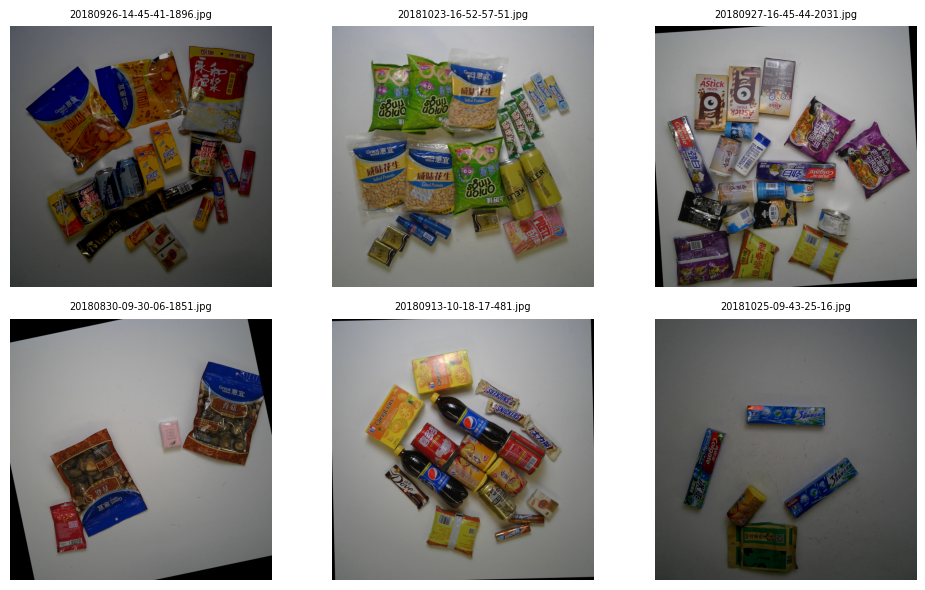

In [ ]:
# === thumbnail_preview.py ===
from pathlib import Path
import random, itertools, cv2
import matplotlib.pyplot as plt

# 路径按需调整
base_dir = Path('/content/retail_robust/data/perturbed_val')
img_dir  = base_dir/'images'
lbl_dir  = base_dir/'labels'

# 统计每张图里有多少对象（方便挑最复杂的）
stats = []
for img_path in img_dir.glob('*.jpg'):
    label_path = lbl_dir/f'{img_path.stem}.txt'
    num_obj = sum(1 for _ in label_path.open()) if label_path.exists() else 0
    stats.append((num_obj, img_path))

# 取 "目标最多" 的前三张 + 额外随机三张
stats_sorted = sorted(stats, key=lambda x: -x[0])
top_imgs = [p for _, p in stats_sorted[:3]]
rand_imgs = random.sample([p for _, p in stats_sorted[3:]], k=3)
show_imgs = list(itertools.chain(top_imgs, rand_imgs))

# 画 2×3 缩略图
fig, axes = plt.subplots(2, 3, figsize=(10, 6))
axes = axes.ravel()
for ax, img_path in zip(axes, show_imgs):
    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
    ax.imshow(img); ax.set_title(img_path.name, fontsize=7)
    ax.axis('off')
for ax in axes[len(show_imgs):]:
    ax.axis('off')

plt.tight_layout(); plt.show()



image 1/1 /content/retail_robust/data/perturbed_val/images/20180913-10-18-17-481.jpg: 640x640 4 bottles, 9.2ms
Speed: 4.0ms preprocess, 9.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/retail_robust/vis/baseline4

image 1/1 /content/retail_robust/data/perturbed_val/images/20180913-10-18-17-481.jpg: 640x640 1 sku_31, 8.1ms
Speed: 3.8ms preprocess, 8.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/retail_robust/vis/finetune4

image 1/1 /content/retail_robust/data/perturbed_val/images/20180913-10-18-17-481.jpg: 640x640 3 sku_6s, 1 sku_39, 1 sku_43, 7.9ms
Speed: 3.9ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/retail_robust/vis/ours4
✓ 已生成定性对比图: /content/retail_robust/figures/abl_qualitative.png


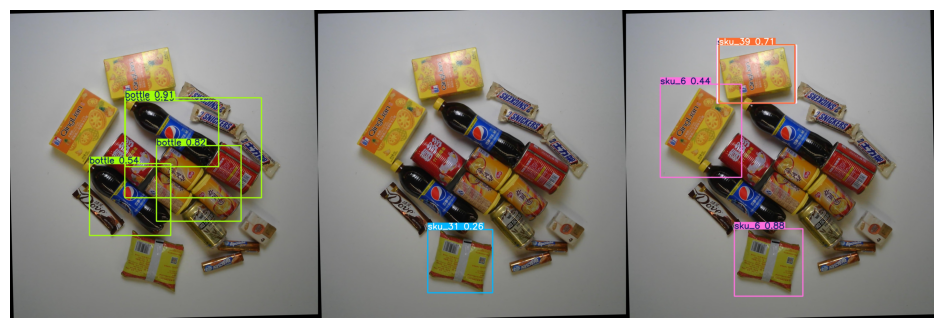

In [ ]:
# ===== generate_abl_qual.py =====
!pip install -q ultralytics pillow matplotlib

from ultralytics import YOLO
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

BASE = Path('/content/retail_robust')
IMG  = BASE/'data/perturbed_val/images/20180913-10-18-17-481.jpg'  # 你的样例
OUT  = BASE/'vis'
FIG  = BASE/'figures'; FIG.mkdir(exist_ok=True)

models = {
    'baseline': 'yolov8s.pt',
    'finetune': BASE/'results/yolo_train/weights/best.pt',
    'ours':     BASE/'results/yolo_train_robust/weights/best.pt'
}

pred_imgs = []
for tag, ckpt in models.items():
    res = YOLO(str(ckpt)).predict(
        source=str(IMG), save=True, imgsz=640,
        project=str(OUT), name=tag, save_conf=False, save_txt=False)
    # Ultralytics returns list; res[0].save_dir is folder containing result image
    save_dir = Path(res[0].save_dir)
    pred_imgs.append(save_dir/IMG.name)

# --- 拼成 1×3 横向大图 ---
imgs = [Image.open(p) for p in pred_imgs]
w, h = imgs[0].size
canvas = Image.new('RGB', (w*3, h), (255,255,255))
for i, im in enumerate(imgs):
    canvas.paste(im, (i*w, 0))

out_path = FIG/'abl_qualitative.png'
canvas.save(out_path, dpi=(300,300))
print('✓ 已生成定性对比图:', out_path)

# 预览
plt.figure(figsize=(12,4)); plt.imshow(canvas); plt.axis('off'); plt.show()


✓ 成功保存对比图: /content/retail_robust/figures/qualitative_compare.png


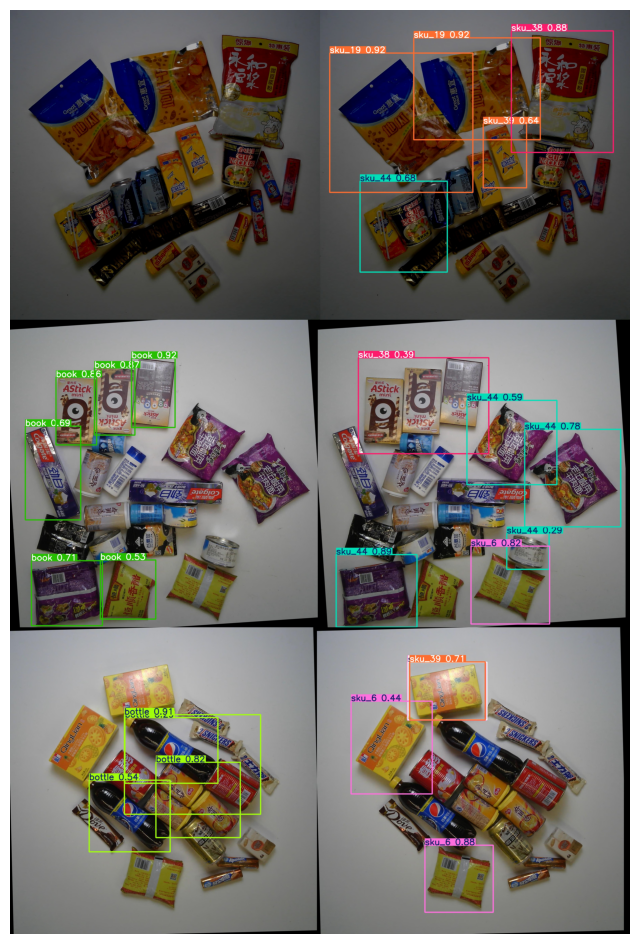

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path

# 设置路径
base = Path('/content/retail_robust/vis')
fig_dir = Path('/content/retail_robust/figures')
fig_dir.mkdir(exist_ok=True)

# 手动挑选代表性图片（从预测图中选）
sample_names = [
    '20180926-14-45-41-1896.jpg',
    '20180927-16-45-44-2031.jpg',
    '20180913-10-18-17-481.jpg'
]

imgs = []
for name in sample_names:
    img_l = Image.open(base/'baseline'/name)
    img_r = Image.open(base/'ours'/name)
    # 拼成左右图
    w, h = img_l.size
    canvas = Image.new('RGB', (w*2, h), (255,255,255))
    canvas.paste(img_l, (0, 0))
    canvas.paste(img_r, (w, 0))
    imgs.append(canvas)

# 再拼成竖图（多行）
total_h = sum(im.height for im in imgs)
canvas_all = Image.new('RGB', (imgs[0].width, total_h))
y = 0
for im in imgs:
    canvas_all.paste(im, (0, y))
    y += im.height

# 保存
out_path = fig_dir/'qualitative_compare.png'
canvas_all.save(out_path, dpi=(300, 300))
print(f'✓ 成功保存对比图: {out_path}')

# 可视化预览
plt.figure(figsize=(10, len(imgs)*4))
plt.imshow(canvas_all); plt.axis('off'); plt.show()


In [ ]:
import os

result_dir = "/content/retail_robust/results/yolo_train"
print("文件目录：", os.listdir(result_dir))


文件目录： ['P_curve.png', 'results.png', 'confusion_matrix_normalized.png', 'PR_curve.png', 'weights', 'args.yaml', 'train_batch0.jpg', 'train_batch6640.jpg', 'train_batch6642.jpg', 'labels_correlogram.jpg', 'F1_curve.png', 'train_batch6641.jpg', 'val_batch0_labels.jpg', 'train_batch2.jpg', 'R_curve.png', 'labels.jpg', 'results.csv', 'train_batch1.jpg', 'val_batch0_pred.jpg', 'confusion_matrix.png']


Column names:
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


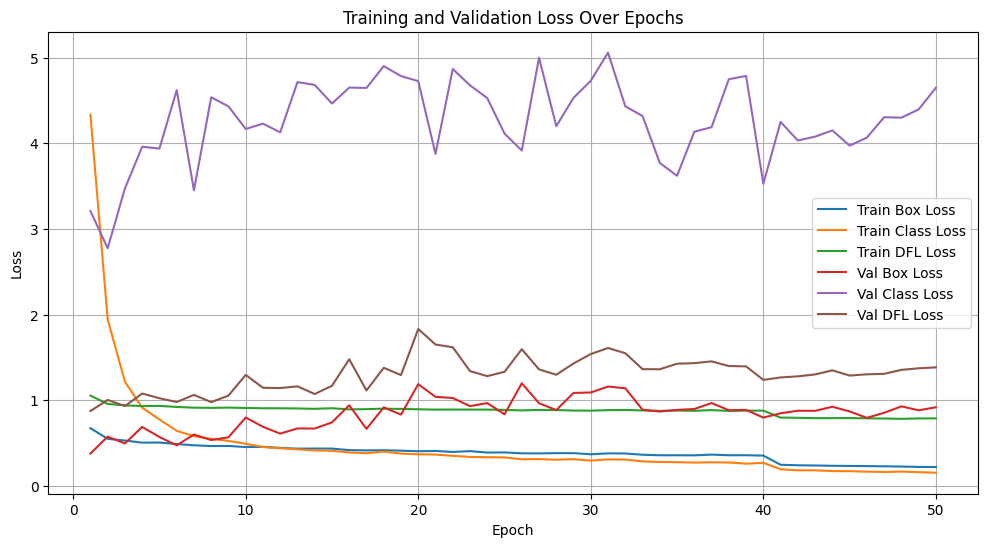

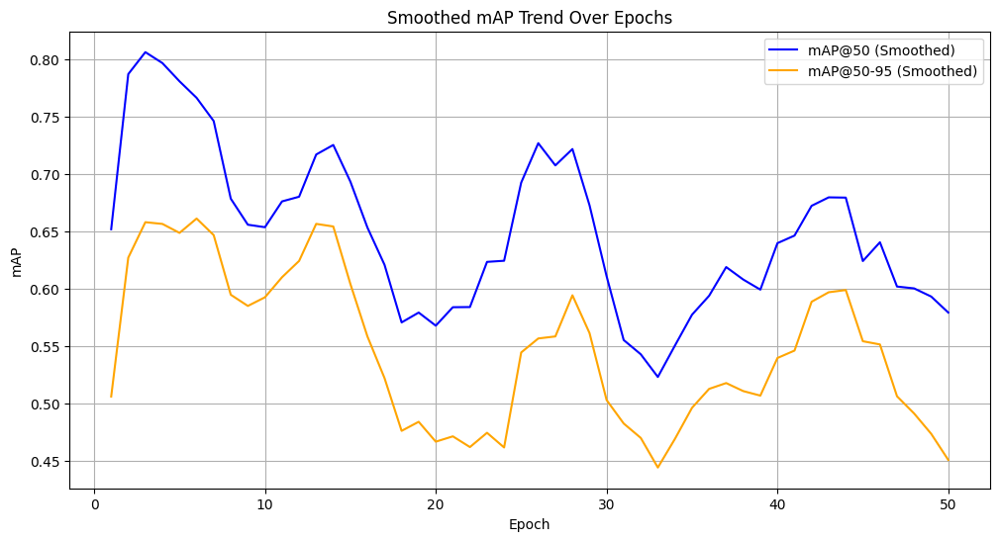

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Set result path
result_dir = "/content/retail_robust/results/yolo_train"
log_path = os.path.join(result_dir, "results.csv")
df = pd.read_csv(log_path)

# Print column names for reference
print("Column names:")
print(df.columns.tolist())

# =========================
# Visualize training and validation loss
# =========================
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Class Loss')
plt.plot(df['epoch'], df['train/dfl_loss'], label='Train DFL Loss')
plt.plot(df['epoch'], df['val/box_loss'], label='Val Box Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Val Class Loss')
plt.plot(df['epoch'], df['val/dfl_loss'], label='Val DFL Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid()
plt.show()

# =========================
# Visualize mAP50 and mAP50-95 (Smoothed)
# =========================
df['mAP50_smooth'] = df['metrics/mAP50(B)'].rolling(window=5, min_periods=1).mean()
df['mAP5095_smooth'] = df['metrics/mAP50-95(B)'].rolling(window=5, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['mAP50_smooth'], label='mAP@50 (Smoothed)', color='blue')
plt.plot(df['epoch'], df['mAP5095_smooth'], label='mAP@50-95 (Smoothed)', color='orange')
plt.title('Smoothed mAP Trend Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.grid()
plt.legend()
plt.show()


In [ ]:
!pip install -q ultralytics
from ultralytics import YOLO

model = YOLO("/content/retail_robust/results/yolo_train/weights/last.pt")
metrics = model.val(
    data="/content/retail_robust/yolo_rpc.yaml",
    project="/content/retail_robust/results",
    name="eval_test"
)


print("验证结果：", metrics)


🔝 Top 5 Performing Classes:


,Class,mAP@50-95
0,sku_50,0.731289
1,sku_17,0.475757
2,sku_2,0.402349
3,sku_3,0.402349
4,sku_5,0.402349


🔻 Bottom 5 Performing Classes:


,Class,mAP@50-95
45,sku_44,0.402349
46,sku_48,0.402349
47,sku_47,0.402349
48,sku_49,0.402349
49,sku_42,0.000000


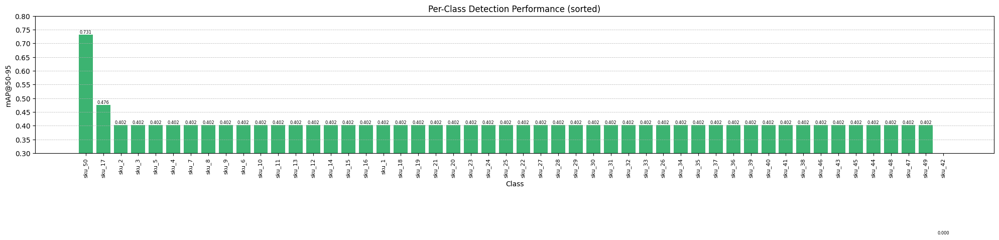

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd

# 从 metrics 对象中提取类别名称和 mAP 值
class_names = list(metrics.names.values())
mAP_values = metrics.maps

# 构建 DataFrame
df_map = pd.DataFrame({
    'Class': class_names,
    'mAP@50-95': mAP_values
})

# 按 mAP 值降序排列
df_map_sorted = df_map.sort_values(by='mAP@50-95', ascending=False).reset_index(drop=True)

# 显示前5和后5的类别 mAP
print("🔝 Top 5 Performing Classes:")
display(df_map_sorted.head(5))

print("🔻 Bottom 5 Performing Classes:")
display(df_map_sorted.tail(5))

# ===============================
# 🎯 绘制每类的 mAP@50-95 柱状图
# ===============================
plt.figure(figsize=(20, 6))
bars = plt.bar(df_map_sorted['Class'], df_map_sorted['mAP@50-95'], color='mediumseagreen')

# 设置 x/y 轴属性
plt.xticks(rotation=90, fontsize=8)
plt.xlabel('Class')
plt.ylabel('mAP@50-95')
plt.title('Per-Class Detection Performance (sorted)')

# ✅ 设置纵轴刻度间隔和格式
plt.gca().yaxis.set_major_locator(ticker.MultipleLocator(0.05))
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))

# ✅ 可选：设置纵轴范围增强对比度
plt.ylim(0.3, 0.8)

# ✅ 可选：在柱顶添加数值标签（仅高或低于阈值的显示）
for i, v in enumerate(df_map_sorted['mAP@50-95']):
    plt.text(i, v + 0.005, f"{v:.3f}", ha='center', fontsize=6)

# ✅ 添加网格
plt.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


In [ ]:
perturbed_dir = "/content/retail_robust/data/perturbed_val"
metrics_perturbed = model.val(
    data="/content/retail_robust/yolo_rpc.yaml",
    imgsz=640,
    batch=16,
    project="/content/retail_robust/results/",
    name="yolo_perturbed_eval",
    save_json=True
)

print("扰动数据集验证结果：", metrics_perturbed)


Ultralytics 8.3.133 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2615.9±387.5 MB/s, size: 234.2 KB)


val: Scanning /content/retail_robust/data/selected_val.cache... 6000 images, 0 backgrounds, 5997 corrupt: 100%|██████████| 6000/6000 [00:00<?, ?it/s]

val: /content/retail_robust/data/selected_val/20180824-13-43-21-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-43-33-401.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-50-07-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-50-21-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-50-43-6.jpg: ignoring corrupt image/label: Label class 147 exceeds dataset class count 50. Possible class labels are 0-49
val: /content/retail_robust/data/selected_val/20180824-13-54-50-406.jpg: ignoring corrupt image/


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.45it/s]


                   all          3         12      0.987      0.703      0.922      0.748
                sku_17          3          3          1      0.842      0.995      0.701
                sku_42          3          6       0.96      0.667      0.777      0.549
                sku_50          3          3          1      0.601      0.995      0.995
Speed: 0.3ms preprocess, 10.2ms inference, 0.0ms loss, 1.8ms postprocess per image
Saving /content/retail_robust/results/yolo_perturbed_eval3/predictions.json...
Results saved to /content/retail_robust/results/yolo_perturbed_eval3
扰动数据集验证结果： ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([16, 41, 49])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b31e39caf90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.

🔝 Top 5 Performing Classes:


,Class,mAP@50-95
0,sku_50,0.995000
1,sku_1,0.748127
2,sku_3,0.748127
3,sku_4,0.748127
4,sku_5,0.748127


🔻 Bottom 5 Performing Classes:


,Class,mAP@50-95
45,sku_44,0.748127
46,sku_49,0.748127
47,sku_47,0.748127
48,sku_17,0.700640
49,sku_42,0.548740


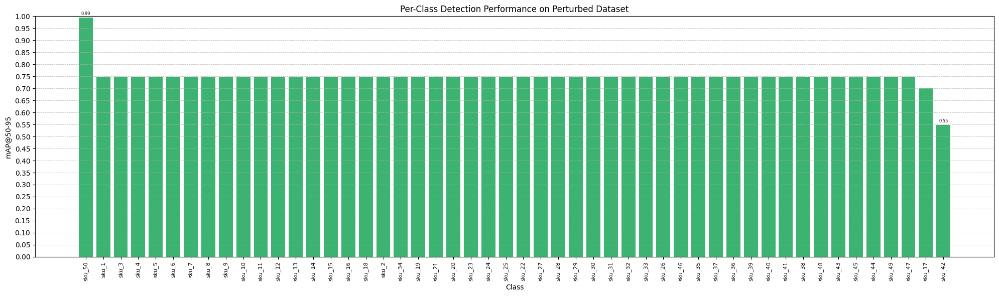

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd

# 提取类别名称和 mAP@50-95 值
class_names = list(metrics_perturbed.names.values())
mAP_values = metrics_perturbed.maps

# 构建 DataFrame
df_map = pd.DataFrame({
    'Class': class_names,
    'mAP@50-95': mAP_values
})

# 按 mAP 值降序排列
df_map_sorted = df_map.sort_values(by='mAP@50-95', ascending=False).reset_index(drop=True)

# 显示前5和后5类别
print("🔝 Top 5 Performing Classes:")
display(df_map_sorted.head(5))

print("🔻 Bottom 5 Performing Classes:")
display(df_map_sorted.tail(5))

# ===============================
# 绘图
# ===============================
plt.figure(figsize=(20, 6))
bars = plt.bar(df_map_sorted['Class'], df_map_sorted['mAP@50-95'], color='mediumseagreen')

# 设置轴标签和格式
plt.xticks(rotation=90, fontsize=8)
plt.xlabel('Class')
plt.ylabel('mAP@50-95')
plt.title('Per-Class Detection Performance on Perturbed Dataset')

# 设置纵轴精度和范围
plt.gca().yaxis.set_major_locator(ticker.MultipleLocator(0.05))
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
plt.ylim(0.0, 1.0)

# 可选：为低于0.6或高于0.9的类别添加标签
for i, v in enumerate(df_map_sorted['mAP@50-95']):
    if v > 0.9 or v < 0.6:
        plt.text(i, v + 0.01, f"{v:.2f}", ha='center', fontsize=6)

plt.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


In [ ]:
import os
import random
from IPython.display import Image, display
from ultralytics import YOLO

# 定义验证集图片目录
val_dir = "/content/retail_robust/data/selected_val"

# 从验证集中随机选择 5 张图片
sample_imgs = random.sample(os.listdir(val_dir), 5)

# 加载模型
model = YOLO("/content/retail_robust/results/yolo_train/weights/best.pt")

# 推理输出目录
inference_dir = "/content/retail_robust/results/inference/predictions"

# 遍历图片执行推理
for img_name in sample_imgs:
    img_path = os.path.join(val_dir, img_name)
    model.predict(
        source=img_path,
        save=True,
        project="/content/retail_robust/results/inference",
        name="predictions"
    )

# 显示推理结果图
for img_name in os.listdir(inference_dir):
    if img_name.endswith(".jpg") or img_name.endswith(".png"):
        display(Image(filename=os.path.join(inference_dir, img_name)))


FileNotFoundError: 133 0.5534035656401946 0.8438060507833604 0.15522420313344137 0.1593354943273906 does not exist

In [ ]:
# 压缩整个 results 文件夹
shutil.make_archive("/content/full_results", 'zip', "/content/retail_robust/results/")
files.download("/content/full_results.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from IPython.display import Image, display
import random
val_dir = "/content/retail_robust/data/selected_val"
imgs = random.sample(os.listdir(val_dir), 5)
for img in imgs:
    display(Image(filename=os.path.join(val_dir, img)))
